# Importing libraries & packages

In [1]:
from shapely.geometry import Polygon
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import folium
from folium.plugins import MarkerCluster
from folium.plugins import FastMarkerCluster
from folium import plugins
import ipywidgets
import geocoder
import geopy
from branca.colormap import LinearColormap
import json
from folium.features import GeoJson, GeoJsonTooltip, GeoJsonPopup
from shapely import wkt

%matplotlib inline

# Reading in files

In [2]:
trout=pd.read_csv('../data/wintertrout_restock.csv')
fish=pd.read_csv('../data/fish_regulations.csv')
camp = gpd.read_file('../data/TN_State_Parks_Campsites.geojson')
water = gpd.read_file('../data/water_in_tn.geojson')
access = gpd.read_file('../data/tn_access.geojson')
restock = gpd.read_file('../data/tn_restock.geojson')

In [3]:
pd.set_option('display.max_columns', None)
access.head()

,OBJECTID,Access_Num,Latitude,Longitude,Region,Area,County,Waterway,Data_Colle,Collection,Name,Alternate,Directions,Parking,Spaces,Trailer_Pa,Hours_Open,Ice,Bait,Camping,Comments,Ramps,Ramp_Struc,Lanes,Launchable,Gas,Owner,Manager,Date_Lease,Type,FourWheel,AccessFee,HandicapPark,LightedPark,OpenYearRound,ClosedMonths,HourAccess_24,SunriseSunset,ElectricHookup,WaterHookup,Restrooms,FishingPier,FishCleaning,CanoeLanding,WinterPool,CourtesyDock,MotorizedVessels,TrollingOnly,RentalOnly,RentalAvail,Lease_TWRA,IncludeWeb,created_user,created_date,last_edited_user,last_edited_date,Guide,PhotoName,MemberOnly,PumpOut,Website,geometry
0,2,2064.0,36.44812,-82.44343,4,Area 42,SULLIVAN,South Fork Holston River,,2008-12-18T00:00:00+00:00,SR 75 Bridge,,I-81 to Hwy. 36 (Fort Henry Drive) to SR 75.,Gravel,Less Than 25 Spaces,Less than 5,24 hour access,Proximity,Proximity,Proximity,Access to Boone Tailwater,1.0,Gravel,1,Up to 17 ft,Proximity,Prob. TDOT,Prob. TDOT,0,Boat Launch,No,No,No,No,Yes,No,Yes,No,No,No,No,No,No,Yes,Yes,No,Yes,No,No,No,No,Yes,None,None,BH01306,2015-10-23T20:31:13+00:00,2829,None,None,None,None,POINT (-82.44343 36.44813)
1,3,2054.0,35.94280,-83.17886,4,Area 42,COCKE,Pigeon River,,2009-01-27T00:00:00+00:00,Tannery Island,,From Newport take Hwy. 73,Dirt and Gravel,Less Than 25 Spaces,Less than 5,24 hour access,Proximity,Proximity,Proximity,Private property that is cuuretnly being used ...,1.0,Dirt,1,Up to 17 ft,Proximity,Private,Private,0,Boat Launch,No,No,No,No,Yes,No,Yes,No,No,No,No,No,No,Yes,Yes,No,Yes,No,No,No,No,Yes,None,None,BH01306,2015-10-23T20:31:13+00:00,2829,None,None,None,None,POINT (-83.17886 35.94281)
2,4,2057.0,36.49595,-82.68752,4,Area 42,HAWKINS,Holston River,,2009-06-02T00:00:00+00:00,Laurel Run Park,,Hwy. 11W to Goshen Valley Rd. to River Rd. to ...,Gravel,Less Than 25 Spaces,Less than 5,24 hour access,Proximity,Proximity,Proximity,Launch for canoes and small boats,1.0,Concrete,1,Up to 17 ft,Proximity,City,City,0,Boat Launch,No,No,Yes,No,No,Yes,No,No,No,No,No,No,No,Yes,Yes,No,Yes,No,No,No,No,Yes,None,None,BH01306,2015-10-23T20:31:13+00:00,2829,None,None,None,None,POINT (-82.68752 36.49596)
3,5,2045.0,36.39710,-87.66070,1,Area 12,STEWART,Lake Barkley Reservoir,1324,None,Wells Creek,,"HWY 233 West of Cumberland City, TN",Gravel,More Than 25 Spaces,11-24 Spaces,24 hour access,Proximity,Proximity,No,,1.0,Concrete,1,All Vessels,No,TVA,TVA,,Boat Launch,No,No,No,No,Yes,No,Yes,No,No,No,No,No,No,No,Yes,Yes,Yes,No,No,No,No,Yes,None,None,BH01306,2015-10-23T20:31:13+00:00,16,None,None,None,None,POINT (-87.66071 36.39711)
4,6,2044.0,36.39960,-87.61760,1,Area 12,STEWART,Lake Barkley Reservoir,1324,None,Guices Creek,,"HWY 149 East of Cumberland City, TN",Paved,More Than 25 Spaces,Greater Than 25 Spaces,24 hour access,Proximity,Proximity,No,,1.0,Concrete,1,All Vessels,No,USACE,USACE,,Boat Launch,No,No,No,No,Yes,No,Yes,No,No,No,No,No,No,No,Yes,No,Yes,No,No,No,No,Yes,None,None,BH01306,2015-10-23T20:31:13+00:00,16,None,None,None,None,POINT (-87.61761 36.39961)


# EDA on dataframes

In [4]:
camp.columns

Index(['FID', 'TSP_CMPSTE_UID', 'TSP_CMPGRD_UID', 'SITE_NO', 'SITE_NAME',
       'ITINIO_ID', 'TSP_UID', 'PARK_NAME', 'geometry'],
      dtype='object')

In [5]:
camp = camp[['TSP_CMPSTE_UID', 'TSP_CMPGRD_UID', 'SITE_NO', 'SITE_NAME',
       'ITINIO_ID', 'TSP_UID', 'PARK_NAME', 'geometry']]

In [6]:
camp.columns=["Park Campsite ID", "Park Campground ID", "Site No", "Site Name",
       'ITINIO_ID', "Park ID", "park_name", 'geometry']

In [7]:
camp.shape

(3238, 8)

<AxesSubplot:>

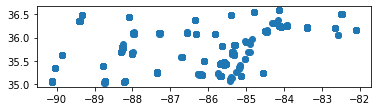

In [8]:
camp.plot()

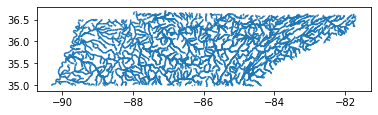

In [9]:
water.plot();

<AxesSubplot:>

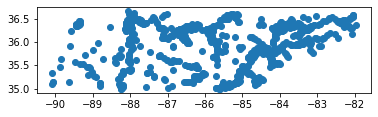

In [10]:
access.plot()

<AxesSubplot:>

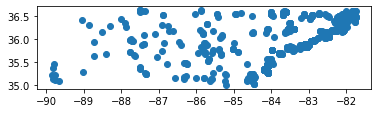

In [11]:
restock.plot()

# Adding a lat & lon column to the camp dataframe from the geometry column

In [12]:
camp['lon'] = camp['geometry'].x
camp['lat'] = camp['geometry'].y

# Dropping duplicates of sites and parks

In [13]:
camp_drop=camp.drop_duplicates(subset= 'park_name', keep= 'first')

In [14]:
camp_site=camp.drop_duplicates(subset= "Site Name", keep= 'first')

In [15]:
camp_site.shape

(2162, 10)

In [16]:
camp_drop.shape

(39, 10)

# Lat and Lon column for fish df

In [17]:
def lat (row):
    if row['Name'] == "Cordell Hull":
      return "36.2912401"
    if row['Name']== "Chickamauga":
      return "35.3388932"
    if row['Name'] == "Barkley and Kentucky Lake":
      return "36.8737369"
    if row['Name']== "Nickajack" :
      return "35.0261218"
    if row['Name'] == "Dale Hollow":
      return "36.5378797"
    if row['Name']== "Center Hill":
      return "36.0288948"
    if row['Name'] == "Barkley":
      return "36.8748355"
    if row['Name']== "Pickwick":
      return "34.9083513"
    if row['Name'] == "Old Hickory":
      return "36.322934"
    if row['Name']== "Guntersville" :
      return "34.5436308"
    if row['Name'] == "Kentucky Lake":
      return "36.4573435"
    if row['Name']== "Normandy":
      return "35.4622185"
    if row['Name']== "Watts Bar":
      return "35.7967834"
    if row['Name'] == "Great Falls":
      return "36.322934"
    if row['Name']== "Parksville" :
      return "35.0924349"
    if row['Name'] == "Cheatham":
      return "36.3110477"
    if row['Name']== "Percy Priest":
      return "36.1569769"
    if row['Name']== "Reelfoot":
      return "36.3906359"

In [18]:
def lon (row):
    if row['Name'] == "Cordell Hull":
      return "-85.9502502"
    if row['Name']== "Chickamauga":
      return "-85.0767705"
    if row['Name'] == "Barkley and Kentucky Lake":
      return "-88.0325808"
    if row['Name']== "Nickajack" :
      return "-85.5592444"
    if row['Name'] == "Dale Hollow":
      return "-85.4688266"
    if row['Name']== "Center Hill":
      return "-85.7647638"
    if row['Name'] == "Barkley":
      return "-87.9925837"
    if row['Name']== "Pickwick":
      return "-88.5057935"
    if row['Name'] == "Old Hickory":
      return "-86.4938828"
    if row['Name']== "Guntersville" :
      return "-86.1610559"
    if row['Name'] == "Kentucky Lake":
      return "-88.2079521"
    if row['Name']== "Normandy":
      return "-86.2120631"
    if row['Name']== "Watts Bar":
      return "-85.6266821"
    if row['Name'] == "Great Falls":
      return "-86.4938828"
    if row['Name']== "Parksville" :
      return "-84.6522195"
    if row['Name'] == "Cheatham":
      return "-87.1836854"
    if row['Name']== "Percy Priest":
      return "-86.6350096"
    if row['Name']== "Reelfoot":
      return "-89.4471987"

In [19]:
fish.head()

,Unnamed: 0,Name,Species,Description,Region
0,0,Barkley,Largemouth/Smallmouth/Spotted Bass:,5 per day in combination.,1
1,1,Barkley,Largemouth Bass:,15 inch minimum length limit.,1
2,2,Barkley,Smallmouth Bass:,18 inch minimum length limit.,1
3,3,Barkley,Spotted Bass:,no length limit.,1
4,4,Barkley,Crappie (all species):,"30 per day in combination, 10 inch minimum len...",1


In [20]:
fish['lat'] = fish.apply(lambda row: lat(row), axis=1)

In [21]:
fish['lon'] = fish.apply(lambda row: lon(row), axis=1)

In [22]:
fish["lat"] = fish.lat.astype(float)
fish["lon"] = fish.lon.astype(float)

In [23]:
fish = fish.drop(["Unnamed: 0"], axis=1)

In [24]:
fish = gpd.GeoDataFrame(
   fish, geometry=gpd.points_from_xy(fish.lon, fish.lat))

In [25]:
fish.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 249 entries, 0 to 248
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   Name         249 non-null    object  
 1   Species      249 non-null    object  
 2   Description  249 non-null    object  
 3   Region       249 non-null    int64   
 4   lat          249 non-null    float64 
 5   lon          249 non-null    float64 
 6   geometry     249 non-null    geometry
dtypes: float64(2), geometry(1), int64(1), object(3)
memory usage: 13.7+ KB


In [29]:
fish.head()

,Name,Species,Description,Region,lat,lon,geometry
0,Barkley,Largemouth/Smallmouth/Spotted Bass:,5 per day in combination.,1,36.874836,-87.992584,POINT (-87.99258 36.87484)
1,Barkley,Largemouth Bass:,15 inch minimum length limit.,1,36.874836,-87.992584,POINT (-87.99258 36.87484)
2,Barkley,Smallmouth Bass:,18 inch minimum length limit.,1,36.874836,-87.992584,POINT (-87.99258 36.87484)
3,Barkley,Spotted Bass:,no length limit.,1,36.874836,-87.992584,POINT (-87.99258 36.87484)
4,Barkley,Crappie (all species):,"30 per day in combination, 10 inch minimum len...",1,36.874836,-87.992584,POINT (-87.99258 36.87484)


<AxesSubplot:>

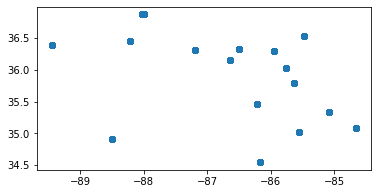

In [30]:
fish.plot()

# Adding Lat and Lon for Trout df

In [26]:
trout.columns=['Region', 'Date', 'Day', 'Name', 'Town', 'County']

In [27]:
trout.head()

,Region,Date,Day,Name,Town,County
0,1,12/4/2020,Friday,Lake Graham,Jackson,Madison
1,1,12/8/2020,Tuesday,Bolivar Park,Bolivar,Hardeman
2,1,12/8/2020,Tuesday,Cameron Brown Lake,Germantown,Shelby
3,1,12/8/2020,Tuesday,Edmund-Orgill Park,Millington,Shelby
4,1,12/8/2020,Tuesday,Shelby Farms,Memphis,Shelby


In [28]:
def lat (row):
    if row['Name'] == "Nice Mill":
      return "35.9413247"
    if row['Name']== "McCutcheon Creek Spring":
      return "35.7507081"
    if row['Name'] == "Harpeth River at Eastern Flank Battle Park":
      return "35.9100915"
    if row['Name']== "Pistol Creek/Greenbelt Lake" :
      return "35.7582895"
    if row['Name'] == "J. Percy Priest Tailwater":
      return "36.1570256"
    if row['Name'] == "Camp Jordan East":
      return "34.9989134"
    if row['Name']== "West Fork Stones River - Manson Pike Trailhead":
      return "35.8575752"
    if row['Name'] == "Cowan City Park":
      return "35.1643461"
    if row['Name']== "Fountain City Lake":
      return "36.0352149"
    if row['Name'] == "Cedar Hill Park Pond":
      return "36.271658"
    if row['Name']== "Shelby Bottoms" :
      return "36.1652305"
    if row['Name'] == "Sulphur Fork Creek":
      return "36.5334286"
    if row['Name']== "Big Rock Greenway":
      return "35.4554794"
    if row['Name']== "Edmund-Orgill Park":
      return "35.3754237"
    if row['Name'] == "Woodland Park Pond":
      return "35.608631"
    if row['Name']== "Cane Creek Park" :
      return "36.1632768"
    if row['Name'] == "L.L. Burns Park Kingston":
      return "36.1016816"
    if row['Name']== "Martin City Pond":
      return "36.317777"
    if row['Name']== "Union City Reelfoot Packing Site Union":
      return "36.398812"
    if row['Name']== "Lake Graham" :
      return "33.1593855"
    if row['Name'] == "Yale Road Park":
      return "35.2168816"
    if row['Name'] == "Stone Bridge Park":
      return "35.1450738"
    if row['Name']== "Davies Plantation":
      return "35.2219911"
    if row['Name']== "Bolivar Park":
      return "35.2579589"
    if row['Name'] == "Beech Lake":
      return "35.68391"
    if row['Name']== "Valentine Park" :
      return "35.4669372"
    if row['Name'] == "McKenzie City Park":
      return "36.1494456"
    if row['Name']== "Cumberland Mountain State Park":
      return "35.897471"
    if row['Name']== "Cameron Brown Lake":
      return "35.1014207"
    if row['Name']== "Billy Dunlop Park" :
      return "36.6091093"
    if row['Name'] == "Marrowbone Lake":
      return "36.3036541"
    if row['Name']== "Athens City Park Pond":
      return "35.4566527"
    if row['Name']== "Johnson Park Lake":
      return "35.0830658"
    if row['Name'] == "Milan City Pond":
      return "35.9135059"
    if row['Name']== "Lafayette City Park" :
      return "36.5154023"
    if row['Name'] == "Lake Junior":
      return "35.0903394"
    if row['Name']== "Paris City Park":
      return "36.4346417"
    if row['Name']== "J.D. Buckner Park":
      return "36.0916447"
    if row['Name']== "Shelby Farms":
      return "35.1380783"
    if row['Name']== "Oneida City Park":
      return "36.4994437"

In [29]:
def lon (row):
    if row['Name'] == "Nice Mill":
      return "-86.4662735"
    if row['Name']== "McCutcheon Creek Spring":
      return "-86.9598671"
    if row['Name'] == "Harpeth River at Eastern Flank Battle Park":
      return "-86.8632915"
    if row['Name']== "Pistol Creek/Greenbelt Lake" :
      return "-83.9741782"
    if row['Name'] == "J. Percy Priest Tailwater":
      return "-86.6198122"
    if row['Name'] == "Camp Jordan East":
      return "-85.1993277"
    if row['Name']== "West Fork Stones River - Manson Pike Trailhead":
      return "-86.4125978"
    if row['Name'] == "Cowan City Park":
      return "-86.0103959"
    if row['Name']== "Fountain City Lake":
      return "-83.9332522"
    if row['Name'] == "Cedar Hill Park Pond":
      return "-86.744793"
    if row['Name']== "Shelby Bottoms" :
      return "-86.7271695"
    if row['Name'] == "Sulphur Fork Creek":
      return "-87.1100144"
    if row['Name']== "Big Rock Greenway":
      return "-86.786204"
    if row['Name']== "Edmund-Orgill Park":
      return "-89.8393459"
    if row['Name'] == "Woodland Park Pond":
      return "-87.051289"
    if row['Name']== "Cane Creek Park" :
      return "-85.5395722"
    if row['Name'] == "L.L. Burns Park Kingston":
      return "-87.1066465"
    if row['Name']== "Martin City Pond":
      return "-88.851859"
    if row['Name']== "Union City Reelfoot Packing Site Union":
      return "-89.011307"
    if row['Name']== "Lake Graham" :
      return "-98.6706667"
    if row['Name'] == "Yale Road Park":
      return "-89.8568724"
    if row['Name'] == "Stone Bridge Park":
      return "-86.5685786"
    if row['Name']== "Davies Plantation":
      return "-89.7615276"
    if row['Name']== "Bolivar Park":
      return "-88.9759797"
    if row['Name'] == "Beech Lake":
      return "-88.4406926"
    if row['Name']== "Valentine Park" :
      return "-89.8057313"
    if row['Name'] == "McKenzie City Park":
      return "-88.5208433"
    if row['Name']== "Cumberland Mountain State Park":
      return "-84.998158 "
    if row['Name']== "Cameron Brown Lake":
      return "-89.7735333"
    if row['Name']== "Billy Dunlop Park" :
      return "-87.3670206"
    if row['Name'] == "Marrowbone Lake":
      return "-86.9173101"
    if row['Name']== "Athens City Park Pond":
      return "-84.641373"
    if row['Name']== "Johnson Park Lake":
      return "-89.6725536"
    if row['Name'] == "Milan City Pond":
      return "-88.7398486"
    if row['Name']== "Lafayette City Park" :
      return "-86.0157261"
    if row['Name'] == "Lake Junior":
      return "-85.2220767"
    if row['Name']== "Paris City Park":
      return "-88.0883011"
    if row['Name']== "J.D. Buckner Park":
      return "-87.4114741"
    if row['Name']== "Shelby Farms":
      return "-89.8339783"
    if row['Name']== "Oneida City Park":
      return "-84.5039556"

In [30]:
trout.head()

,Region,Date,Day,Name,Town,County
0,1,12/4/2020,Friday,Lake Graham,Jackson,Madison
1,1,12/8/2020,Tuesday,Bolivar Park,Bolivar,Hardeman
2,1,12/8/2020,Tuesday,Cameron Brown Lake,Germantown,Shelby
3,1,12/8/2020,Tuesday,Edmund-Orgill Park,Millington,Shelby
4,1,12/8/2020,Tuesday,Shelby Farms,Memphis,Shelby


In [31]:
trout.apply(lambda row: lat(row), axis=1)

0     33.1593855
1     35.2579589
2     35.1014207
3     35.3754237
4     35.1380783
         ...    
89    35.9413247
90    36.1652305
91    35.1643461
92    35.7507081
93    35.9100915
Length: 94, dtype: object

In [32]:
trout.apply(lambda row: lon(row), axis=1)

0     -98.6706667
1     -88.9759797
2     -89.7735333
3     -89.8393459
4     -89.8339783
         ...     
89    -86.4662735
90    -86.7271695
91    -86.0103959
92    -86.9598671
93    -86.8632915
Length: 94, dtype: object

In [33]:
trout["lat"] = trout.lat.astype(float)
trout["lon"] = trout.lon.astype(float)

AttributeError: 'DataFrame' object has no attribute 'lat'

In [34]:
trout = gpd.GeoDataFrame(
   trout, geometry=gpd.points_from_xy(trout.lon, trout.lat))

AttributeError: 'DataFrame' object has no attribute 'lon'

In [35]:
trout.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 94 entries, 0 to 93
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Region  94 non-null     int64 
 1   Date    94 non-null     object
 2   Day     94 non-null     object
 3   Name    94 non-null     object
 4   Town    94 non-null     object
 5   County  94 non-null     object
dtypes: int64(1), object(5)
memory usage: 4.5+ KB


# fish_dictionary
### creating a dictionary to connect the fish df to the df of water through Tennessee to add the fish info to the water tool tip

In [41]:
fish_dict = {
            "Cordell Hull" : "Cumberland River",
            "Barkley and Kentucky Lake": "Tennessee River",
            "Nickajack": "Tenessee River",
            "Dale Hollow":"Obey River",
            "Chickamauga":"Tennessee River",
            "Center Hill":"Caney Fork",
            "Pickwick":"Tennessee River",
            "Barkley":"Cumberland River",
            "Kentucky Lake":"Blood River",
            "Guntersville":"Tennessee River",
            "Old Hickory":"Cumberland River",
            "Normandy":"Duck River",
            "Watts Bar":"Tennessee River",
            "Great Falls":"Collins River",
            "Parksville":"Ocoee River",
            "Cheatham":"Cumberland River", 
            "Percy Priest":"Stones River",
            "Reelfoot": "Running Slough"            
}

In [42]:
fish["stream"]=fish["Name"].map(fish_dict)
fish.head()

,Name,Species,Description,Region,lat,lon,geometry,stream
0,Barkley,Largemouth/Smallmouth/Spotted Bass:,5 per day in combination.,1,36.874836,-87.992584,POINT (-87.99258 36.87484),Cumberland River
1,Barkley,Largemouth Bass:,15 inch minimum length limit.,1,36.874836,-87.992584,POINT (-87.99258 36.87484),Cumberland River
2,Barkley,Smallmouth Bass:,18 inch minimum length limit.,1,36.874836,-87.992584,POINT (-87.99258 36.87484),Cumberland River
3,Barkley,Spotted Bass:,no length limit.,1,36.874836,-87.992584,POINT (-87.99258 36.87484),Cumberland River
4,Barkley,Crappie (all species):,"30 per day in combination, 10 inch minimum len...",1,36.874836,-87.992584,POINT (-87.99258 36.87484),Cumberland River


# Combining fish and water df

In [43]:
combined = pd.merge(fish, water,left_on='stream', right_on = "Name")

In [67]:
combined.columns

Index(['Name_x', 'Species', 'Description', 'Region_x', 'lat', 'lon',
       'geometry_x', 'stream', 'Name_y', 'Feature', 'State', 'Region_y',
       'Miles', 'Shape__Length', 'geometry_y'],
      dtype='object')

In [66]:
combined[['Name_x', 'Species', 'Description', 'Region_x', 'lat', 'lon',
       'geometry_x', 'stream', 'Name_y', 'Feature', 'State', 'Region_y',
       'Miles', 'Shape__Length', 'geometry_y']]

Name_x                                                     Barkley
Species                                     Catfish (all species):
Description      No creel limit for fish 34 inches and less in ...
Region_x                                                         1
lat                                                        36.8748
lon                                                       -87.9926
geometry_x                          POINT (-87.9925837 36.8748355)
stream                                            Cumberland River
Name_y                                            Cumberland River
Feature                                            Artificial Path
State                                                           TN
Region_y                                                         5
Miles                                                         2.04
Shape__Length                                            0.0294913
geometry_y       LINESTRING (-87.8931896896091 36.634254786891

In [25]:
water.head()

,Name,Feature,State,Region,Miles,Shape__Length,geometry
0,Tennessee River,Artificial Path,AL-MS-TN,6,2.07,0.030367,"LINESTRING (-88.19653 34.98789, -88.20003 34.9..."
1,Sugar Creek,Stream,AL-TN,6,0.38,0.005340,"LINESTRING (-87.19329 35.00010, -87.19276 34.9..."
2,Second Creek,Stream,AL-TN,6,0.97,0.014897,"LINESTRING (-87.99035 35.01086, -87.99183 35.0..."
3,Shoal Creek,Stream,AL-TN,6,0.58,0.008851,"LINESTRING (-87.57578 35.00679, -87.57701 35.0..."
4,Tennessee River,Artificial Path,AL-TN,6,1.35,0.018735,"LINESTRING (-85.70046 34.98978, -85.70047 34.9..."


In [54]:
fish.shape

(249, 8)

# Folium map of parks and water to fish in throughout Tennessee

In [27]:
TN=(36.2800424,-85.7026846)
fish_map = folium.Map(location=TN, zoom_start=6.4)

In [28]:
folium.Choropleth(water,line_weight=3,line_color='blue', opacity = .1).add_to(fish_map)

title_html = '''
             <h3 align="center" style="font-size:20px"><b>Tennessee Trout Fishing</b></h3>
             '''
fish_map.get_root().html.add_child(folium.Element(title_html))

#cluster map for campgrounds
marker_cluster = MarkerCluster().add_to(fish_map)

folium.GeoJson(water, 
               tooltip = GeoJsonTooltip(fields=["Name","Feature","Miles"],
                                                 labels=True,
                                                 sticky=True,
                                                 toLocalestring=True)
              ).add_to(fish_map)


#popups
for row_index, row_values in camp_drop.iterrows():
    loc = [row_values['lat'], row_values['lon']]
    pop = str(row_values["park_name"])
    icon=folium.Icon(color="green",icon= 'tree', prefix='fa')
    
    marker = folium.Marker(
        location = loc, 
        popup = pop,
    icon = icon) 
    
    marker.add_to(marker_cluster)
    
fish_map

In [23]:
folium.Choropleth(water,line_weight=3,line_color='blue', opacity = .1).add_to(fish_map)

title_html = '''
             <h3 align="center" style="font-size:20px"><b>Tennessee Trout Fishing</b></h3>
             '''
fish_map.get_root().html.add_child(folium.Element(title_html))

#cluster map for campgrounds
marker_cluster = MarkerCluster().add_to(fish_map)

#tooltip for streams
folium.GeoJson(combined, 
               tooltip = GeoJsonTooltip(fields=["Name_x","Species","Description",'stream','Feature','Miles'],
                                        aliases =["Lake","Species","Desc","River","Feature","Miles"],
                                                 labels=True,
                                                 sticky=True,
                                                 toLocalestring=True)
              ).add_to(fish_map)


#popups for parks to camp at
for row_index, row_values in camp_drop.iterrows():
    loc = [row_values['lat'], row_values['lon']]
    pop = str(row_values["park_name"])
    icon=folium.Icon(color="green",icon= 'tree', prefix='fa')
    
    
    marker = folium.Marker(
        location = loc, 
        popup = pop,
    icon = icon) 
    
    marker.add_to(marker_cluster)
    
fish_map

NameError: name 'fish_map' is not defined

In [ ]:
# make stream invisible but keep tooltip?